## NLP Final - Notebook #2 (Topic Modeling)
Author: Natalie Kim

Quarter: Winter 2025

In [1]:
import pandas as pd
# df_final = pd.read_parquet('final_data_clean.parquet')
df_final = pd.read_parquet('nlpfinal-nskim-bucket/nlp-final-clean-data/final_data_clean.parquet')

In [2]:
df_final.head(5)

,url,date,title_clean,title_clean_lower,text_clean_ner,text_clean_topic
0,http://www.dataweek.co.za/21690r,2024-04-05,Flash for AI 28 March 2024 EBV Electrolink Dat...,flash for ai 28 march 2024 ebv electrolink dat...,Flash for AI 28 March 2024 EBV Electrolink Dat...,flash for ai 28 march 2024 ebv electrolink dat...
1,http://www.mysmartrend.com/news-briefs/technic...,2020-04-17,Cr Bard Inc Has Returned 48.9% Since SmarTrend...,cr bard inc has returned 48.9% since smartrend...,Cr Bard Inc Has Returned 48.9% Since Recommend...,cr bard inc has returned 48.9% since recommend...
2,https://abcnews.go.com/Entertainment/video/ai-...,2024-04-06,Video AI used for hiring and firing focus of b...,video ai used for hiring and firing focus of b...,Video AI used for hiring and firing focus of b...,video ai used for hiring and firing focus of b...
3,https://boingboing.net/2020/08/14/cory-doctoro...,2020-08-14,Cory Doctorow experiments with AI writing part...,cory doctorow experiments with ai writing part...,Cory Doctorow experiments with AI writing part...,cory doctorow experiments with ai writing part...
4,https://cio.economictimes.indiatimes.com/news/...,2023-05-31,Artificial Intelligence Top AI CEOs experts ra...,artificial intelligence top ai ceos experts ra...,"Artificial Intelligence: Top AI CEOs, experts ...",artificial intelligence top ai ce os experts r...


In [3]:
# using full dataset
df_sub = df_final
df_sub.shape

# # get subset of data (10%)
# df_sub = df_final.sample(frac=0.1, random_state=1)
# df_sub.shape

(198891, 6)

In [4]:
import sys
print(sys.version)

3.10.16 | packaged by conda-forge | (main, Dec  5 2024, 14:16:10) [GCC 13.3.0]


In [5]:
import time
start_time = time.time()

def tic():
    global start_time 
    start_time = time.time()

def tac():
    t_sec = round(time.time() - start_time)
    (t_min, t_sec) = divmod(t_sec,60)
    (t_hour,t_min) = divmod(t_min,60) 
    print(f'Execution time to calculate for topic {k}: {t_hour}hour:{t_min}min:{t_sec}sec'.format(t_hour,t_min,t_sec))

In [6]:
import multiprocessing as mp
num_processors = mp.cpu_count()
print(f"Number of processors: {num_processors}")

workers = num_processors-1
print(f'Using {workers} workers')

Number of processors: 16
Using 15 workers


In [7]:
import warnings
warnings.simplefilter('ignore')

In [8]:
import os
import re
import string
import numpy as np

import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')

from bertopic import BERTopic
from gensim.models import Phrases
from gensim.models.phrases import Phraser
from gensim.utils import simple_preprocess

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/jupyter/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [9]:
# combine text and titles
df_sub['title_text'] = df_sub['title_clean_lower'] + ' ' + df_sub['text_clean_topic']
df_sub.head()

,url,date,title_clean,title_clean_lower,text_clean_ner,text_clean_topic,title_text
0,http://www.dataweek.co.za/21690r,2024-04-05,Flash for AI 28 March 2024 EBV Electrolink Dat...,flash for ai 28 march 2024 ebv electrolink dat...,Flash for AI 28 March 2024 EBV Electrolink Dat...,flash for ai 28 march 2024 ebv electrolink dat...,flash for ai 28 march 2024 ebv electrolink dat...
1,http://www.mysmartrend.com/news-briefs/technic...,2020-04-17,Cr Bard Inc Has Returned 48.9% Since SmarTrend...,cr bard inc has returned 48.9% since smartrend...,Cr Bard Inc Has Returned 48.9% Since Recommend...,cr bard inc has returned 48.9% since recommend...,cr bard inc has returned 48.9% since smartrend...
2,https://abcnews.go.com/Entertainment/video/ai-...,2024-04-06,Video AI used for hiring and firing focus of b...,video ai used for hiring and firing focus of b...,Video AI used for hiring and firing focus of b...,video ai used for hiring and firing focus of b...,video ai used for hiring and firing focus of b...
3,https://boingboing.net/2020/08/14/cory-doctoro...,2020-08-14,Cory Doctorow experiments with AI writing part...,cory doctorow experiments with ai writing part...,Cory Doctorow experiments with AI writing part...,cory doctorow experiments with ai writing part...,cory doctorow experiments with ai writing part...
4,https://cio.economictimes.indiatimes.com/news/...,2023-05-31,Artificial Intelligence Top AI CEOs experts ra...,artificial intelligence top ai ceos experts ra...,"Artificial Intelligence: Top AI CEOs, experts ...",artificial intelligence top ai ce os experts r...,artificial intelligence top ai ceos experts ra...


In [10]:
# additional preprocessing
stop_words = set(stopwords.words('english'))

additional_stopwords = ['january', 'february', 'march', 'april', 'may', 'june', 'july', 'august', 'september', 'october', 'november', 'december',
                        "und", "die", "das", "von", "zu", "mit", "auf", "für", "ist", "im", "den", "der", "nicht", "ein", "eine", "als", "auch", 
                        "es", "an", "werden", "aus", "nach", "bei", "hat", "dass", "sich", "am", "noch", "wird", "wenn", "war", "sind", "oder", 
                        "aber", "zum", "so", "jetzt",'ke','ho', 'ki','said', 'di', 'ia', 'il','le', 'ka', 'te',
                       '2018','2019','2020','2021','2022','2023','2024', 'nachrichten', 'ber', 'bersicht','fa', 'na', 'news', 'jpeg']

stop_words.update(additional_stopwords)

### BERTopic

In [11]:
# remove any leftover special characters
df_sub['bert_title_text'] = df_sub['title_text'].map(lambda x: re.sub('[^a-zA-Z0-9 @ . , : - _]', '', str(x)))

# remove stopwords
df_sub['bert_title_text'] = df_sub['bert_title_text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

bert_text_list = df_sub['bert_title_text'].tolist()

In [ ]:
%%time
bert_topic_model = BERTopic(language="english", min_topic_size=200, n_gram_range=(1,3), calculate_probabilities=False, verbose=True)
topics, probs = bert_topic_model.fit_transform(bert_text_list)

2025-03-09 19:52:08,285 - BERTopic - Embedding - Transforming documents to embeddings.


Batches:   0%|          | 0/6216 [00:00<?, ?it/s]

2025-03-09 20:53:18,842 - BERTopic - Embedding - Completed ✓
2025-03-09 20:53:18,844 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-09 20:56:25,517 - BERTopic - Dimensionality - Completed ✓
2025-03-09 20:56:25,522 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current p

CPU times: user 11h 22min 7s, sys: 13min 50s, total: 11h 35min 57s
Wall time: 1h 18min 58s


In [28]:
freq = bert_topic_model.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
freq.head(5)

Topics found: 131


,Topic,Count,Name,Representation,Representative_Docs
0,-1,94510,-1_ai_data_new_gray,"[ai, data, new, gray, media, technology, inc, ...",[sampp global named best artificial intelligen...
1,0,6566,0_rawpixel_px_px 300_300,"[rawpixel, px, px 300, 300, rawpixel ltd, gene...",[lake landscape outdoors nature ai free photo ...
2,1,4040,1_gpt_chat_chat gpt_open ai,"[gpt, chat, chat gpt, open ai, open, ai, chatg...",[7 best chatgpt alternatives ive tested toms g...
3,2,3190,2_market_artificial intelligence_artificial_in...,"[market, artificial intelligence, artificial, ...",[global artificial intelligence iot market rep...
4,3,2921,3_energy_climate_data_ai,"[energy, climate, data, ai, water, power, sola...",[ibm advances geospatial ai address climate ch...


In [29]:
bert_topic_model.visualize_topics()

In [34]:
bert_topic_model.reduce_topics(bert_text_list, nr_topics='auto')
bert_topic_model.visualize_topics()

2025-03-09 21:33:42,496 - BERTopic - Topic reduction - Reducing number of topics
2025-03-09 21:46:00,786 - BERTopic - Topic reduction - Reduced number of topics from 100 to 91


In [35]:
freq = bert_topic_model.get_topic_info()

print(f"Topics found: {freq.shape[0]}")
freq.head(5)

Topics found: 91


,Topic,Count,Name,Representation,Representative_Docs
0,-1,94510,-1_ai_data_new_media,"[ai, data, new, media, gray, technology, us, i...",[sampp global named best artificial intelligen...
1,0,17853,0_market_ai_price_share,"[market, ai, price, share, share price, stocks...",[venture capitalist ai opportunities investors...
2,1,7585,1_rawpixel_px_px 300_300,"[rawpixel, px, px 300, 300, rawpixel ltd, gene...",[forest backgrounds landscape outdoors ai free...
3,2,5641,2_gpt_chat_chat gpt_microsoft,"[gpt, chat, chat gpt, microsoft, open ai, open...",[openais gpt4 different predecessor gpt3.5 int...
4,3,4176,3_ai_biden_intelligence_artificial,"[ai, biden, intelligence, artificial, new, tec...",[biden sign sweeping executive order artificia...


In [32]:
from sklearn.metrics.pairwise import cosine_similarity
distance_matrix = cosine_similarity(np.array(bert_topic_model.topic_embeddings_))
dist_df = pd.DataFrame(distance_matrix, columns=bert_topic_model.topic_labels_.values(), 
                       index=bert_topic_model.topic_labels_.values())

tmp = []
for rec in dist_df.reset_index().to_dict('records'):
    t1 = rec['index']
    for t2 in rec:
        if t2 == 'index': 
            continue
        tmp.append(
            {
                'topic1': t1, 
                'topic2': t2, 
                'distance': rec[t2]
            }
        )

pair_dist_df = pd.DataFrame(tmp)

pair_dist_df = pair_dist_df[(pair_dist_df.topic1.map(
      lambda x: not x.startswith('-1'))) & 
            (pair_dist_df.topic2.map(lambda x: not x.startswith('-1')))]
pair_dist_df = pair_dist_df[pair_dist_df.topic1 < pair_dist_df.topic2]
pair_dist_df.sort_values('distance', ascending = False).head(20)

,topic1,topic2,distance
1104,10_security_ai_cybersecurity_cyber,3_ai_biden_intelligence_artificial,0.883394
1731,16_share price_price_share_stocks,30_average_moving average_crypto_cookies,0.880024
3507,34_ai_product_product hunt_hunt,6_ai_customer_data_business,0.867202
331,2_nasdaq_stock_ai_stocks,30_average_moving average_crypto_cookies,0.862062
2007,19_ai_job_jobs_workers,6_ai_customer_data_business,0.860708
307,2_nasdaq_stock_ai_stocks,6_ai_customer_data_business,0.859189
507,4_market_analysis_growth_global,6_ai_customer_data_business,0.855468
3510,34_ai_product_product hunt_hunt,9_ai_image_google_video,0.853159
1907,18_ai_retail_retailers_shopping,6_ai_customer_data_business,0.852003
3180,30_average_moving average_crypto_cookies,79_finance_yahoo_screener_stocks,0.849054


In [19]:
%%time

# saving model
path_bert = 'topic models'

if not os.path.isdir(path_bert): os.mkdir(path_bert)

bert_topic_model.save(path_bert +'/bert_model')

# save topic information to csv file
topic_info.to_csv("topic_info.csv", index=False)

2025-03-09 18:08:05,832 - BERTopic - WARNING: When you use `pickle` to save/load a BERTopic model,please make sure that the environments in which you saveand load the model are **exactly** the same. The version of BERTopic,its dependencies, and python need to remain the same.


CPU times: user 5min 55s, sys: 6.77 s, total: 6min 2s
Wall time: 5min 57s


In [43]:
# Get topic info as a DataFrame
topic_info = bert_topic_model.get_topic_info()

In [45]:
pd.set_option('display.max_rows', None)

# Now when you display topic_info, it will show all rows.
topic_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,94510,-1_ai_data_new_media,"[ai, data, new, media, gray, technology, us, i...",[sampp global named best artificial intelligen...
1,0,17853,0_market_ai_price_share,"[market, ai, price, share, share price, stocks...",[venture capitalist ai opportunities investors...
2,1,7585,1_rawpixel_px_px 300_300,"[rawpixel, px, px 300, 300, rawpixel ltd, gene...",[forest backgrounds landscape outdoors ai free...
3,2,5641,2_gpt_chat_chat gpt_microsoft,"[gpt, chat, chat gpt, microsoft, open ai, open...",[openais gpt4 different predecessor gpt3.5 int...
4,3,4176,3_ai_biden_intelligence_artificial,"[ai, biden, intelligence, artificial, new, tec...",[biden sign sweeping executive order artificia...
5,4,3519,4_healthcare_market_medical_health,"[healthcare, market, medical, health, care, pa...",[artificial intelligence healthcare market ana...
6,5,3156,5_india_ai_share_indian,"[india, ai, share, indian, delhi, rs, us, live...",[india indiaai submit ai rules framework two w...
7,6,2921,6_energy_climate_ai_data,"[energy, climate, ai, data, water, power, new,...",[upstream energy sector increasingly turns art...
8,7,2558,7_students_education_gpt_chat gpt,"[students, education, gpt, chat gpt, chat, ai,...",[us colleges want chatgptproof assignments sto...
9,8,2461,8_ai_image_google_video,"[ai, image, google, video, images, art, adobe,...",[top ai image generators software french polyn...


In [38]:
# save topic information to csv file
topic_info = bert_topic_model.get_topic_info()

topic_info.to_csv("topic_info.csv", index=False)

In [39]:
df_sub['topic'] = bert_topic_model.topics_

In [40]:
df_sub.head(5)

,url,date,title_clean,title_clean_lower,text_clean_ner,text_clean_topic,title_text,bert_title_text,topic
0,http://www.dataweek.co.za/21690r,2024-04-05,Flash for AI 28 March 2024 EBV Electrolink Dat...,flash for ai 28 march 2024 ebv electrolink dat...,Flash for AI 28 March 2024 EBV Electrolink Dat...,flash for ai 28 march 2024 ebv electrolink dat...,flash for ai 28 march 2024 ebv electrolink dat...,flash ai 28 ebv electrolink dataweek flash ai ...,-1
1,http://www.mysmartrend.com/news-briefs/technic...,2020-04-17,Cr Bard Inc Has Returned 48.9% Since SmarTrend...,cr bard inc has returned 48.9% since smartrend...,Cr Bard Inc Has Returned 48.9% Since Recommend...,cr bard inc has returned 48.9% since recommend...,cr bard inc has returned 48.9% since smartrend...,cr bard inc returned 48.9 since smartrend reco...,35
2,https://abcnews.go.com/Entertainment/video/ai-...,2024-04-06,Video AI used for hiring and firing focus of b...,video ai used for hiring and firing focus of b...,Video AI used for hiring and firing focus of b...,video ai used for hiring and firing focus of b...,video ai used for hiring and firing focus of b...,video ai used hiring firing focus book journal...,-1
3,https://boingboing.net/2020/08/14/cory-doctoro...,2020-08-14,Cory Doctorow experiments with AI writing part...,cory doctorow experiments with ai writing part...,Cory Doctorow experiments with AI writing part...,cory doctorow experiments with ai writing part...,cory doctorow experiments with ai writing part...,cory doctorow experiments ai writing partner s...,-1
4,https://cio.economictimes.indiatimes.com/news/...,2023-05-31,Artificial Intelligence Top AI CEOs experts ra...,artificial intelligence top ai ceos experts ra...,"Artificial Intelligence: Top AI CEOs, experts ...",artificial intelligence top ai ce os experts r...,artificial intelligence top ai ceos experts ra...,artificial intelligence top ai ceos experts ra...,3


In [41]:
df_sub.to_csv("df_with_topics.csv", index=False)

### Sentiment Analysis

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from transformers import pipeline

In [5]:
df = pd.read_csv("df_with_topics.csv")

In [3]:
df.head()

,url,date,title_clean,title_clean_lower,text_clean_ner,text_clean_topic,title_text,bert_title_text,topic
0,http://www.dataweek.co.za/21690r,2024-04-05,Flash for AI 28 March 2024 EBV Electrolink Dat...,flash for ai 28 march 2024 ebv electrolink dat...,Flash for AI 28 March 2024 EBV Electrolink Dat...,flash for ai 28 march 2024 ebv electrolink dat...,flash for ai 28 march 2024 ebv electrolink dat...,flash ai 28 ebv electrolink dataweek flash ai ...,-1
1,http://www.mysmartrend.com/news-briefs/technic...,2020-04-17,Cr Bard Inc Has Returned 48.9% Since SmarTrend...,cr bard inc has returned 48.9% since smartrend...,Cr Bard Inc Has Returned 48.9% Since Recommend...,cr bard inc has returned 48.9% since recommend...,cr bard inc has returned 48.9% since smartrend...,cr bard inc returned 48.9 since smartrend reco...,35
2,https://abcnews.go.com/Entertainment/video/ai-...,2024-04-06,Video AI used for hiring and firing focus of b...,video ai used for hiring and firing focus of b...,Video AI used for hiring and firing focus of b...,video ai used for hiring and firing focus of b...,video ai used for hiring and firing focus of b...,video ai used hiring firing focus book journal...,-1
3,https://boingboing.net/2020/08/14/cory-doctoro...,2020-08-14,Cory Doctorow experiments with AI writing part...,cory doctorow experiments with ai writing part...,Cory Doctorow experiments with AI writing part...,cory doctorow experiments with ai writing part...,cory doctorow experiments with ai writing part...,cory doctorow experiments ai writing partner s...,-1
4,https://cio.economictimes.indiatimes.com/news/...,2023-05-31,Artificial Intelligence Top AI CEOs experts ra...,artificial intelligence top ai ceos experts ra...,"Artificial Intelligence: Top AI CEOs, experts ...",artificial intelligence top ai ce os experts r...,artificial intelligence top ai ceos experts ra...,artificial intelligence top ai ceos experts ra...,3


In [5]:
'''
some relevant topics
- finance/market: 0
- healthcare: 4
- climate/energy: 6
- image & video generation: 8
- law: 12
- music: 13
- retail: 14
- jobs: 15
- driving/vehicles: 18
- sports (topic 19)
- drug discovery (topic 22)
- insurance (topic 31)
- nutrition (topic 48)
- religion (topic 51)
- mental health/therapy (topic 52)
- military systems (topic 54)
- films - 55
- agriculture - 56
- travel - 69
'''
# selecting top candidates
# df_sent = df_sub[df_sub['topic'].isin([0, 4, 6, 8, 12, 22, 31, 54, 56, 69])]
# df_sent = df_sub[df_sub['topic'].isin([0, 4, 12, 14, 15, 22])]
df_sent = df[df['topic'].isin([0, 4, 12, 15])]
df_sent.shape

(24677, 9)

In [6]:
# initialize sentiment analysis pipeline
sentiment_pipe = pipeline("text-classification", 
                          model="siebert/sentiment-roberta-large-english", 
                          device = -1,
                          truncation=True
                          )

Device set to use cpu


In [7]:
# converting sentiment output to numeric score
def get_sentiment_score(text):
    try:
        result = sentiment_pipe(text)[0]
        # Assign a positive score if label is POSITIVE, negative if NEGATIVE.
        score = result['score'] if result['label'] == "POSITIVE" else -result['score']
        return score
    except Exception as e:
        return 0.0

In [10]:
import multiprocessing as mp
num_processors = mp.cpu_count()
workers = num_processors - 1
print(f"Number of processors: {num_processors}")
print(f"Using {workers} workers")

Number of processors: 16
Using 15 workers


In [11]:
from tqdm import tqdm
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [ ]:
%%time

if __name__ == '__main__':
    # Get the list of texts from the DataFrame
    texts = df_sent['text_clean_topic'].tolist()
    
    # Create a pool of workers and map the function over your text list with a progress bar.
    with mp.Pool(workers) as pool:
        sentiment_scores = list(tqdm(pool.imap(get_sentiment_score, texts), total=len(texts)))
    
    # Save the results back to the DataFrame
    df_sent['sentiment_score'] = sentiment_scores

100%|██████████| 24677/24677 [14:00:51<00:00,  2.04s/it]  


CPU times: user 2min 7s, sys: 25.8 s, total: 2min 33s
Wall time: 14h 52s


<timed exec>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [19]:
# converting 'date' column
df_sent['date'] = pd.to_datetime(df_sent['date'])

df_sent.to_csv("df_topic_sentiment.csv", index=False)

/var/tmp/ipykernel_4153/869489683.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sent['date'] = pd.to_datetime(df_sent['date'])


In [20]:
df_sent.head()

,url,date,title_clean,title_clean_lower,text_clean_ner,text_clean_topic,title_text,bert_title_text,topic,sentiment_score
17,https://finance.yahoo.com/news/overjet-sinks-t...,2021-12-20,Overjet sinks its teeth into another round of ...,overjet sinks its teeth into another round of ...,Overjet sinks its teeth into another round of ...,overjet sinks its teeth into another round of ...,overjet sinks its teeth into another round of ...,overjet sinks teeth another round capital dent...,0,0.994517
22,https://investorplace.com/2024/06/3-ai-stocks-...,2024-06-12,3 AI Stocks to Sell ASAP as Antitrust Concerns...,3 ai stocks to sell asap as antitrust concerns...,3 AI Stocks to Sell ASAP as Antitrust Concerns...,3 ai stocks to sell asap as antitrust concerns...,3 ai stocks to sell asap as antitrust concerns...,3 ai stocks sell asap antitrust concerns rise ...,0,-0.920993
27,https://menafn.com/1108662738/Compulink-And-Qu...,2024-09-11,Compulink And Quantum AI Health Partner To Lau...,compulink and quantum ai health partner to lau...,Compulink And Quantum AI Health Partner To Lau...,compulink and quantum ai health partner to lau...,compulink and quantum ai health partner to lau...,compulink quantum ai health partner launch aip...,4,0.998862
31,https://newsinpaphos.com/uncategorized/146825/...,2021-07-05,Machine Learning Market Size Opportunities Tre...,machine learning market size opportunities tre...,"Machine Learning Market Size, Opportunities, T...",machine learning market size opportunities tre...,machine learning market size opportunities tre...,machine learning market size opportunities tre...,0,0.998764
41,https://scientect.com/news/145160/machine-lear...,2020-08-17,Machine Learning Operationalization Software M...,machine learning operationalization software m...,Machine Learning Operationalization Software M...,machine learning operationalization software m...,machine learning operationalization software m...,machine learning operationalization software m...,0,0.996867


In [22]:
# grouping sentiment score by month & average
sentiment_timeline = df_sent.groupby(pd.Grouper(key='date', freq='ME'))['sentiment_score'].mean()

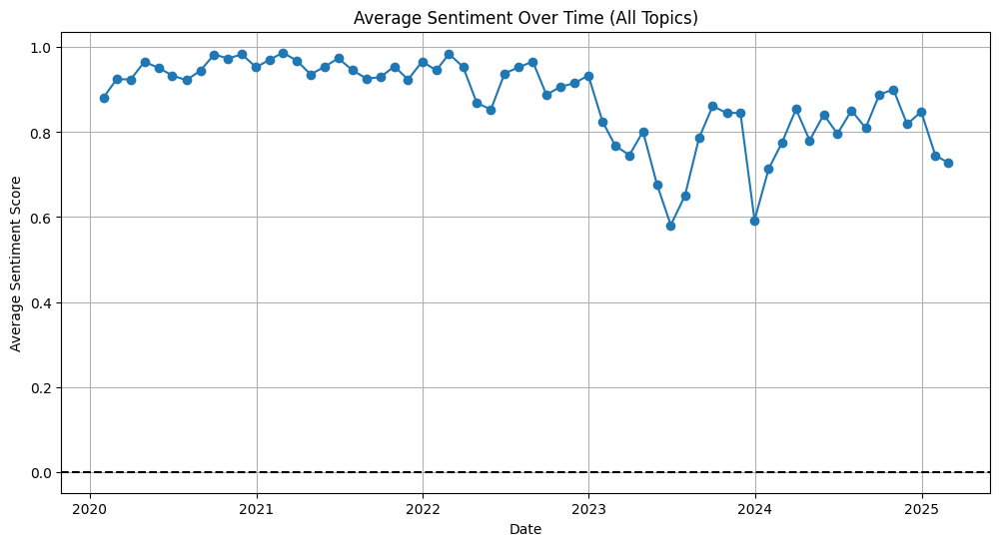

In [23]:
# plotting sentiment over time timeline
plt.figure(figsize=(12, 6))
plt.plot(sentiment_timeline.index, sentiment_timeline.values, marker='o')
plt.title("Average Sentiment Over Time (All Topics)")
plt.xlabel("Date")
plt.ylabel("Average Sentiment Score")
plt.axhline(0, color='black', linestyle='--')
plt.grid(True)
plt.show()

In [25]:
# Group by topic and by month (or another frequency) to get the average sentiment score
grouped = df_sent.groupby(['topic', pd.Grouper(key='date', freq='ME')])['sentiment_score'].mean().reset_index()

In [26]:
selected_topics = [0, 4, 12, 15]

topic_names = {
    0: "Finance/Market",
    4: "Healthcare",
    12: "Law",
    15: "Jobs"
}

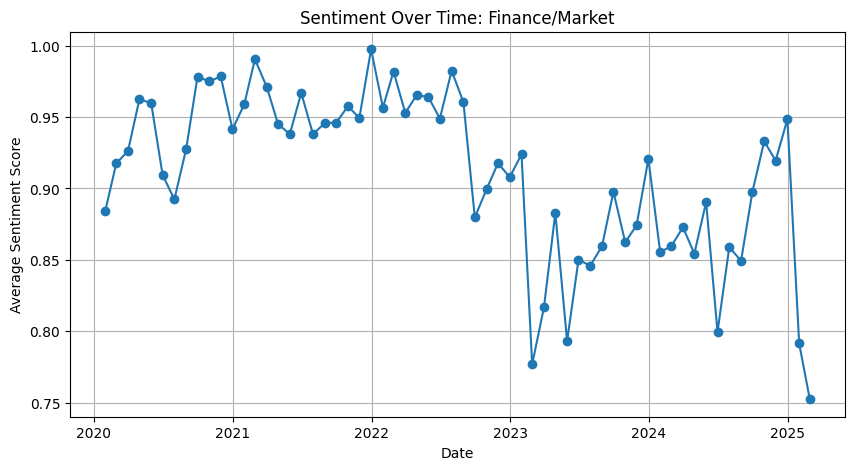

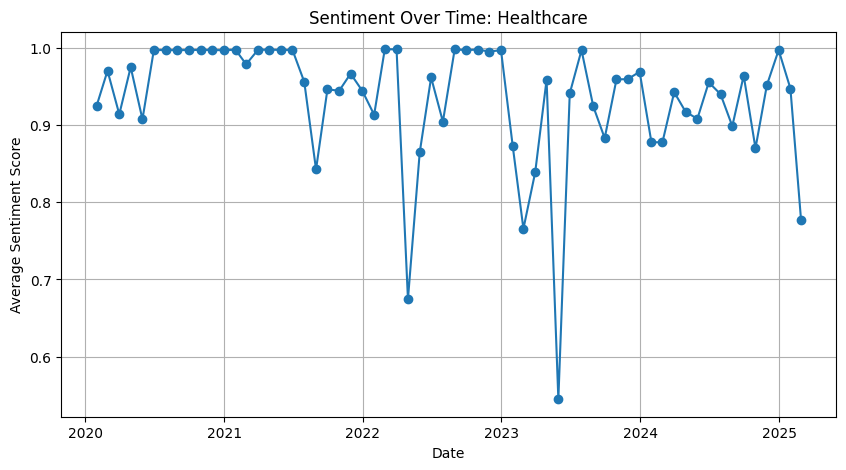

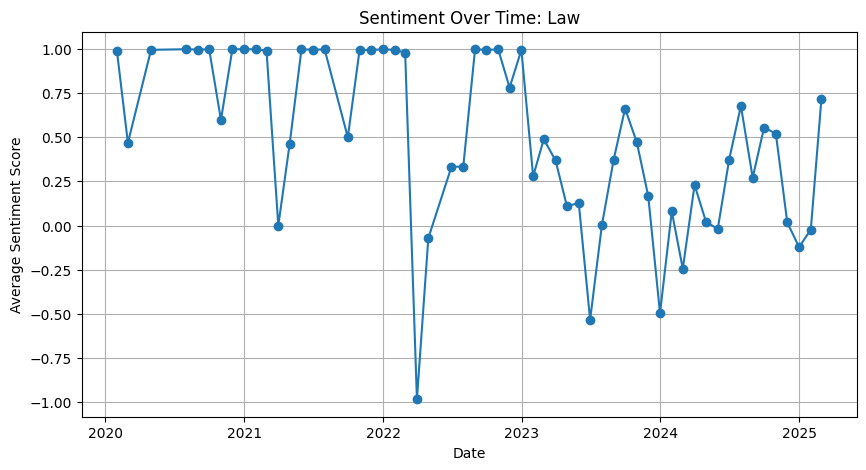

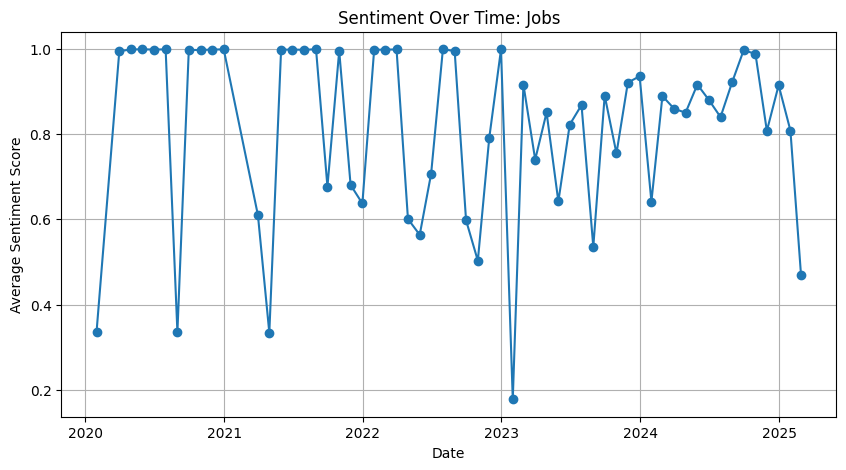

In [27]:
for topic in selected_topics:
    # Filter grouped data for the current topic:
    topic_data = grouped[grouped['topic'] == topic]
    
    # Create a new plot for each topic:
    plt.figure(figsize=(10, 5))
    plt.plot(topic_data['date'], topic_data['sentiment_score'], marker='o', linestyle='-')
    
    # Use the human-readable name if it exists; otherwise, fallback to "Topic X"
    label = topic_names.get(topic, f"Topic {topic}")
    plt.title(f"Sentiment Over Time: {label}")
    plt.xlabel("Date")
    plt.ylabel("Average Sentiment Score")
    plt.grid(True)
    plt.show()

In [29]:
df_sent.shape

(24677, 10)

#### Additional Sentiment Analysis on Topics

In [2]:
import os
import multiprocessing as mp
import pandas as pd
from transformers import pipeline
from pandarallel import pandarallel

os.environ["TOKENIZERS_PARALLELISM"] = "false"

num_workers = mp.cpu_count() - 1
pandarallel.initialize(nb_workers=num_workers, progress_bar=True)

INFO: Pandarallel will run on 7 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [13]:
'''
some relevant topics
- finance/market: 0
- healthcare: 4
- climate/energy: 6
- image & video generation: 8
- law: 12
- music: 13
- retail: 14
- jobs: 15
- driving/vehicles: 18
- sports (topic 19)
- drug discovery (topic 22)
- insurance (topic 31)
- nutrition (topic 48)
- religion (topic 51)
- mental health/therapy (topic 52)
- military systems (topic 54)
- films - 55
- agriculture - 56
- travel - 69
'''
df_sent2 = df[df['topic'].isin([0, 4, 6, 8, 12, 14, 15, 18, 22, 31, 52, 54, 56, 69])].copy()

In [14]:
df_sent2['textandtitle_clean'] = df_sent2['title_clean'] + ' ' + df_sent2['text_clean_ner']
df_sent2.head()

,url,date,title_clean,title_clean_lower,text_clean_ner,text_clean_topic,title_text,bert_title_text,topic,textandtitle_clean
11,https://citylife.capetown/uncategorized/machin...,2023-12-08,Machine Learning Revolutionizes Surface Predic...,machine learning revolutionizes surface predic...,Machine Learning Revolutionizes Surface Predic...,machine learning revolutionizes surface predic...,machine learning revolutionizes surface predic...,machine learning revolutionizes surface predic...,6,Machine Learning Revolutionizes Surface Predic...
16,https://exbulletin.com/tech/2033143/,2023-02-02,How does artificial intelligence work and how ...,how does artificial intelligence work and how ...,"How does artificial intelligence work, and how...",how does artificial intelligence work and how ...,how does artificial intelligence work and how ...,artificial intelligence work disrupting tech i...,31,How does artificial intelligence work and how ...
17,https://finance.yahoo.com/news/overjet-sinks-t...,2021-12-20,Overjet sinks its teeth into another round of ...,overjet sinks its teeth into another round of ...,Overjet sinks its teeth into another round of ...,overjet sinks its teeth into another round of ...,overjet sinks its teeth into another round of ...,overjet sinks teeth another round capital dent...,0,Overjet sinks its teeth into another round of ...
22,https://investorplace.com/2024/06/3-ai-stocks-...,2024-06-12,3 AI Stocks to Sell ASAP as Antitrust Concerns...,3 ai stocks to sell asap as antitrust concerns...,3 AI Stocks to Sell ASAP as Antitrust Concerns...,3 ai stocks to sell asap as antitrust concerns...,3 ai stocks to sell asap as antitrust concerns...,3 ai stocks sell asap antitrust concerns rise ...,0,3 AI Stocks to Sell ASAP as Antitrust Concerns...
27,https://menafn.com/1108662738/Compulink-And-Qu...,2024-09-11,Compulink And Quantum AI Health Partner To Lau...,compulink and quantum ai health partner to lau...,Compulink And Quantum AI Health Partner To Lau...,compulink and quantum ai health partner to lau...,compulink and quantum ai health partner to lau...,compulink quantum ai health partner launch aip...,4,Compulink And Quantum AI Health Partner To Lau...


In [8]:
# initialize sentiment analysis pipeline
sentiment_pipe = pipeline("text-classification", 
                          model="siebert/sentiment-roberta-large-english", 
                          device = -1,
                          truncation=True
                          )

Device set to use cpu


In [16]:
def get_sentiment_score(text):
    try:
        result = sentiment_pipe(text)[0]
        return result['score'] if result['label'] == "POSITIVE" else -result['score']
    except Exception as e:
        print(f"Error processing text: {e}")
        return None  # Handle errors gracefully

# Apply sentiment analysis in parallel using pandarallel
df_sent2["sentiment_score"] = df_sent2["textandtitle_clean"].parallel_apply(get_sentiment_score)

In [18]:
df_sent2.head()

,url,date,title_clean,title_clean_lower,text_clean_ner,text_clean_topic,title_text,bert_title_text,topic,textandtitle_clean,sentiment_score
11,https://citylife.capetown/uncategorized/machin...,2023-12-08,Machine Learning Revolutionizes Surface Predic...,machine learning revolutionizes surface predic...,Machine Learning Revolutionizes Surface Predic...,machine learning revolutionizes surface predic...,machine learning revolutionizes surface predic...,machine learning revolutionizes surface predic...,6,Machine Learning Revolutionizes Surface Predic...,0.998657
16,https://exbulletin.com/tech/2033143/,2023-02-02,How does artificial intelligence work and how ...,how does artificial intelligence work and how ...,"How does artificial intelligence work, and how...",how does artificial intelligence work and how ...,how does artificial intelligence work and how ...,artificial intelligence work disrupting tech i...,31,How does artificial intelligence work and how ...,0.997860
17,https://finance.yahoo.com/news/overjet-sinks-t...,2021-12-20,Overjet sinks its teeth into another round of ...,overjet sinks its teeth into another round of ...,Overjet sinks its teeth into another round of ...,overjet sinks its teeth into another round of ...,overjet sinks its teeth into another round of ...,overjet sinks teeth another round capital dent...,0,Overjet sinks its teeth into another round of ...,-0.982570
22,https://investorplace.com/2024/06/3-ai-stocks-...,2024-06-12,3 AI Stocks to Sell ASAP as Antitrust Concerns...,3 ai stocks to sell asap as antitrust concerns...,3 AI Stocks to Sell ASAP as Antitrust Concerns...,3 ai stocks to sell asap as antitrust concerns...,3 ai stocks to sell asap as antitrust concerns...,3 ai stocks sell asap antitrust concerns rise ...,0,3 AI Stocks to Sell ASAP as Antitrust Concerns...,-0.975818
27,https://menafn.com/1108662738/Compulink-And-Qu...,2024-09-11,Compulink And Quantum AI Health Partner To Lau...,compulink and quantum ai health partner to lau...,Compulink And Quantum AI Health Partner To Lau...,compulink and quantum ai health partner to lau...,compulink and quantum ai health partner to lau...,compulink quantum ai health partner launch aip...,4,Compulink And Quantum AI Health Partner To Lau...,0.998839


In [19]:
df_sent2.to_csv("df_topic_sentiment2.csv")

In [26]:
topic_names = {
    0: "Finance/Market",
    4: "Healthcare",
    6: "Climate/Energy",
    8: "Image & Video Gen",
    12: "Law",
    14: "Retail",
    15: "Jobs",
    18: "Driving/Vehicles",
    22: "Drug Discovery",
    31: "Insurance",
    52: "Mental Health/Therapy",
    54: "Military Systems",
    56: "Agriculture",
    69: "Travel"
}


In [31]:
from collections import defaultdict
topic_sentiment_sum = defaultdict(float)  # Total sentiment score (for averaging)
topic_sentiment_count = defaultdict(int)  # Count of all sentiment instances
topic_positive_sentiment_sum = defaultdict(float)  # Sum of only positive sentiment
topic_negative_sentiment_sum = defaultdict(float)  # Sum of only negative sentiment
topic_positive_sentiment_count = defaultdict(int)  # Count of positive sentiment instances
topic_negative_sentiment_count = defaultdict(int)  # Count of negative sentiment instances

In [34]:
for _, row in df_sent2.iterrows():
    topic = row["topic"]
    sentiment = row["sentiment_score"]

    topic_sentiment_sum[topic] += sentiment
    topic_sentiment_count[topic] += 1
    
    if sentiment > 0:
        topic_positive_sentiment_sum[topic] += sentiment
        topic_positive_sentiment_count[topic] += 1
    elif sentiment < 0:
        topic_negative_sentiment_sum[topic] += sentiment
        topic_negative_sentiment_count[topic] += 1

# Compute average sentiment per topic
topic_avg_sentiment = {
    topic: topic_sentiment_sum[topic] / topic_sentiment_count[topic]
    for topic in topic_sentiment_sum
}

# Compute average positive sentiment per topic
topic_avg_positive_sentiment = {
    topic: (topic_positive_sentiment_sum[topic] / topic_positive_sentiment_count[topic])
    if topic_positive_sentiment_count[topic] > 0 else 0
    for topic in topic_positive_sentiment_sum
}

# Compute average negative sentiment per topic
topic_avg_negative_sentiment = {
    topic: (topic_negative_sentiment_sum[topic] / topic_negative_sentiment_count[topic])
    if topic_negative_sentiment_count[topic] > 0 else 0
    for topic in topic_negative_sentiment_sum
}


In [39]:
topic_sentiment_df = pd.DataFrame({
    "topic": list(topic_avg_sentiment.keys()),
    "name": [topic_names.get(topic, f"Topic {topic}") for topic in topic_avg_sentiment],
    "positive": [topic_positive_sentiment_count[topic] for topic in topic_avg_sentiment],
    "negative": [topic_negative_sentiment_count[topic] for topic in topic_avg_sentiment]
})

In [40]:
topic_sentiment_df.head()

,topic,name,positive,negative
0,6,Climate/Energy,2756,165
1,31,Insurance,738,40
2,0,Finance/Market,16919,934
3,4,Healthcare,3433,86
4,14,Retail,1585,73


In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

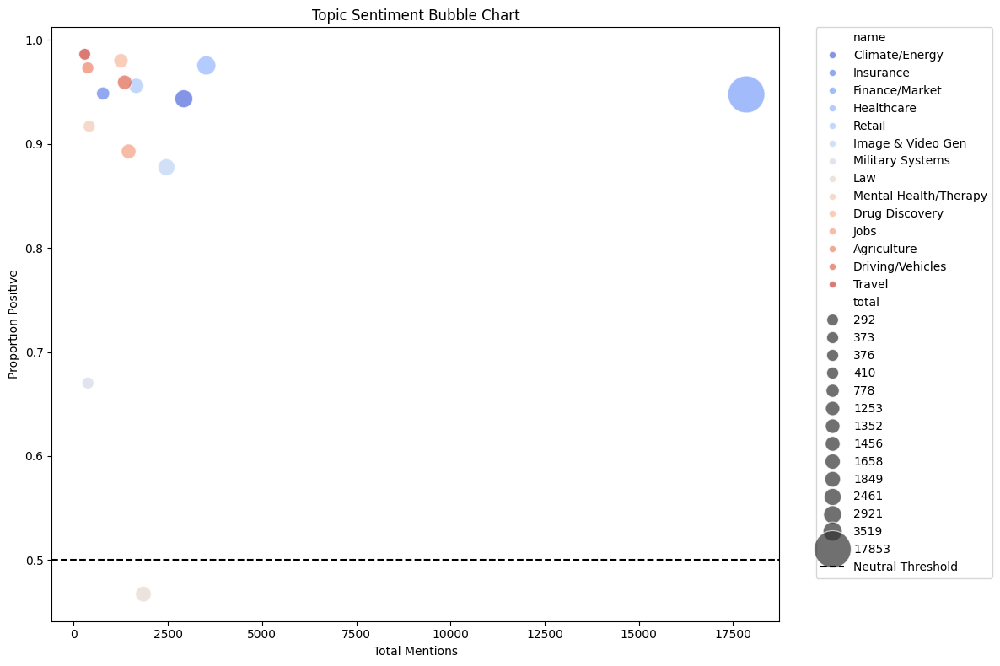

In [45]:
topic_sentiment_df['total'] = topic_sentiment_df['positive'] + topic_sentiment_df['negative']
topic_sentiment_df['prop_positive'] = topic_sentiment_df['positive'] / topic_sentiment_df['total']

# Create bubble chart using seaborn
plt.figure(figsize=(12, 8))
bubble = sns.scatterplot(
    data=topic_sentiment_df,
    x='total', 
    y='prop_positive',
    size='total', 
    sizes=(100, 1000),
    hue='name', 
    palette='coolwarm',
    alpha=0.7,
    legend='full'
)
plt.xlabel("Total Mentions")
plt.ylabel("Proportion Positive")
plt.title("Topic Sentiment Bubble Chart")
plt.axhline(0.5, color='black', linestyle='--', label="Neutral Threshold")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.show()

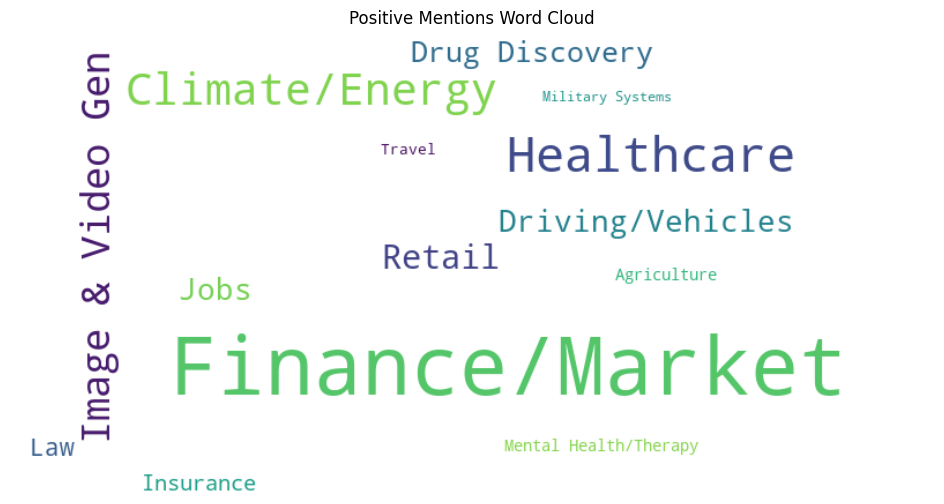

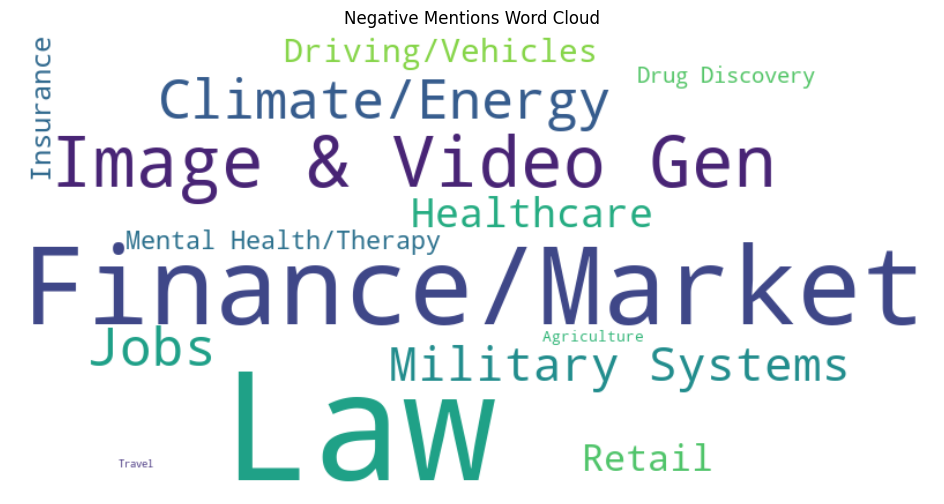

In [43]:
# Create dictionaries mapping topic names to positive and negative counts:
positive_dict = dict(zip(topic_sentiment_df['name'], topic_sentiment_df['positive']))
negative_dict = dict(zip(topic_sentiment_df['name'], topic_sentiment_df['negative']))

# Generate word cloud for positive mentions
wc_positive = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(positive_dict)

plt.figure(figsize=(12, 6))
plt.imshow(wc_positive, interpolation='bilinear')
plt.axis("off")
plt.title("Positive Mentions Word Cloud")
plt.show()

# Generate word cloud for negative mentions
wc_negative = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(negative_dict)

plt.figure(figsize=(12, 6))
plt.imshow(wc_negative, interpolation='bilinear')
plt.axis("off")
plt.title("Negative Mentions Word Cloud")
plt.show()

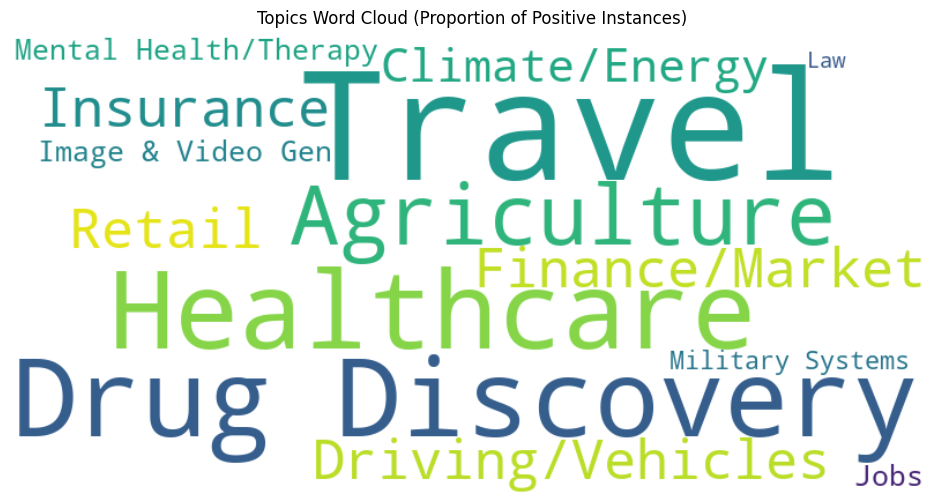

In [51]:
topic_sentiment_dict = dict(zip(topic_sentiment_df["name"], topic_sentiment_df["prop_positive"]))

# # Define a color function based on `prop_positive`
# def sentiment_color_func(word, font_size, position, orientation, random_state=None, **kwargs):
#     proportion = topic_sentiment_dict.get(word, 0.5)  # Default to neutral if not found
#     if proportion > 0.5:
#         return "blue"  # More positive mentions → Blue
#     else:
#         return "red"   # More negative mentions → Red

# Generate the Word Cloud (topics appear once, colored by positive proportion)
wc_combined = WordCloud(
    width=800, height=400, background_color='white'
).generate_from_frequencies({k: abs(v) for k, v in topic_sentiment_dict.items()})

# Plot Word Cloud
plt.figure(figsize=(12, 6))
plt.imshow(wc_combined, interpolation='bilinear')
plt.axis("off")
plt.title("Topics Word Cloud (Proportion of Positive Instances)")
plt.show()

In [54]:
topic_sentiment_df

,topic,name,positive,negative,total,prop_positive,prop_negative
0,6,Climate/Energy,2756,165,2921,0.943512,0.056488
1,31,Insurance,738,40,778,0.948586,0.051414
2,0,Finance/Market,16919,934,17853,0.947684,0.052316
3,4,Healthcare,3433,86,3519,0.975561,0.024439
4,14,Retail,1585,73,1658,0.955971,0.044029
5,8,Image & Video Gen,2160,301,2461,0.877692,0.122308
6,54,Military Systems,252,124,376,0.670213,0.329787
7,12,Law,864,985,1849,0.467280,0.532720
8,52,Mental Health/Therapy,376,34,410,0.917073,0.082927
9,22,Drug Discovery,1228,25,1253,0.980048,0.019952


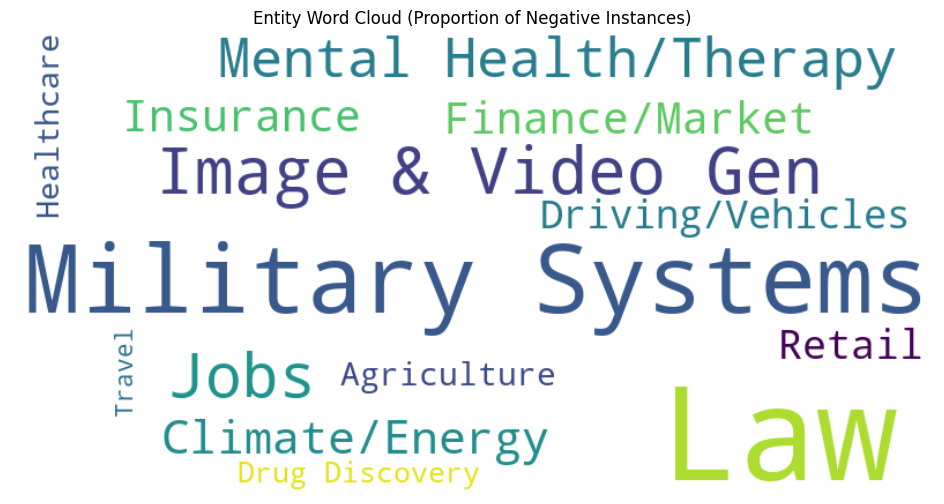

In [53]:
topic_sentiment_df['prop_negative'] = topic_sentiment_df['negative'] / topic_sentiment_df['total']

topic_sentiment_dict_temp = dict(zip(topic_sentiment_df["name"], topic_sentiment_df["prop_negative"]))


# Generate the Word Cloud (topics appear once, colored by positive proportion)
wc_combined = WordCloud(
    width=800, height=400, background_color='white'
).generate_from_frequencies({k: abs(v) for k, v in topic_sentiment_dict_temp.items()})

# Plot Word Cloud
plt.figure(figsize=(12, 6))
plt.imshow(wc_combined, interpolation='bilinear')
plt.axis("off")
plt.title("Entity Word Cloud (Proportion of Negative Instances)")
plt.show()

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/2624057255.py:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_sent2.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


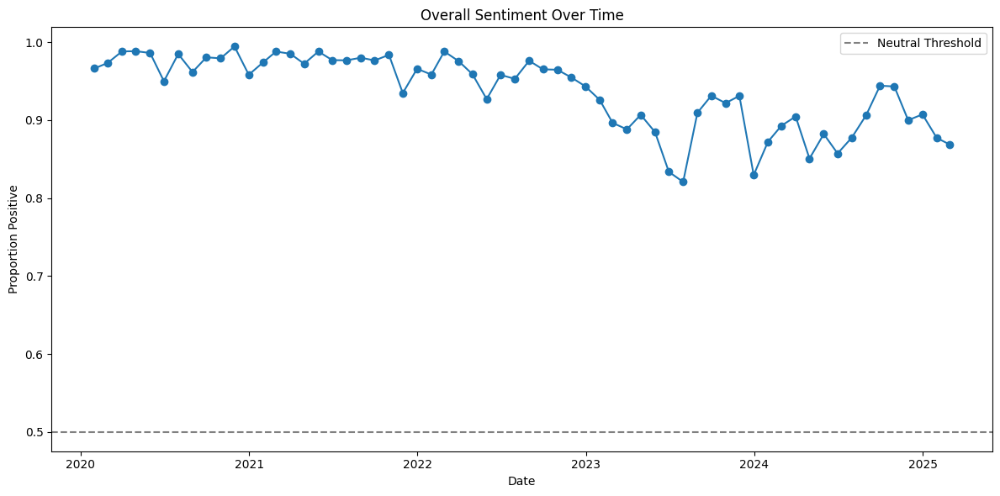

In [56]:
df_sent2['sentiment_binary'] = df_sent2['sentiment_score'].apply(lambda x: 1 if x > 0 else 0)

# Make sure the date column is in datetime format
df_sent2['date'] = pd.to_datetime(df_sent2['date'])

# Group by month (or day) and compute the average sentiment_binary (which equals the proportion positive)
sentiment_over_time = df_sent2.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()

# Plot the time series
plt.figure(figsize=(12,6))
plt.plot(sentiment_over_time['date'], sentiment_over_time['sentiment_binary'], marker='o', linestyle='-')
plt.xlabel("Date")
plt.ylabel("Proportion Positive")
plt.title("Overall Sentiment Over Time")
plt.axhline(0.5, color='gray', linestyle='--', label="Neutral Threshold")
plt.legend()
plt.tight_layout()
plt.show()

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


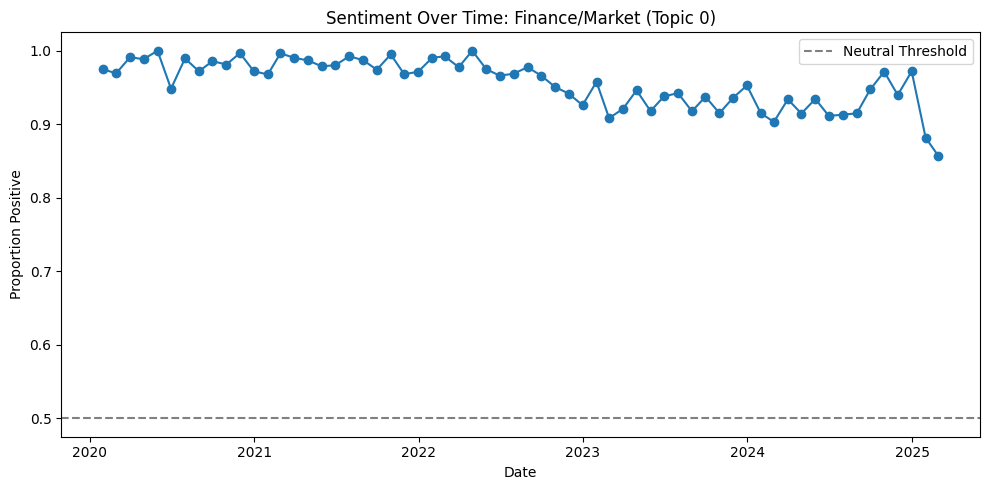

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


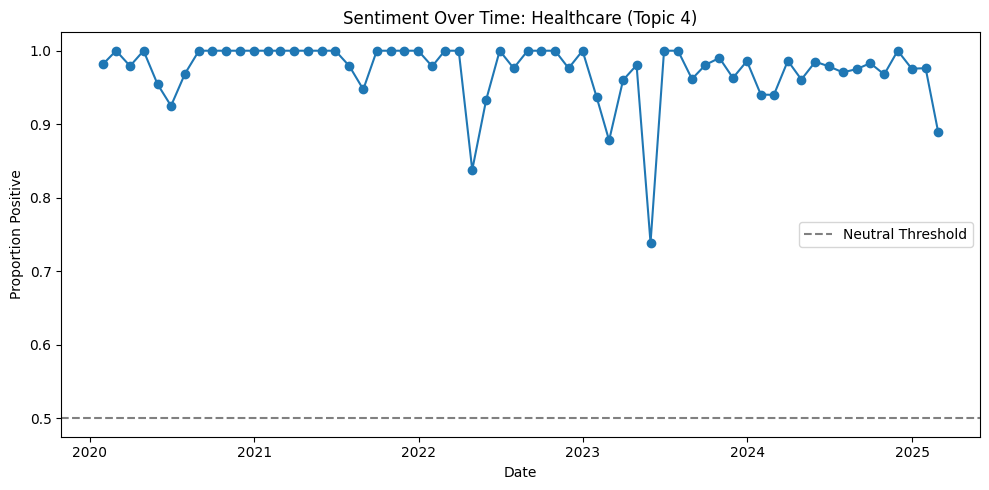

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


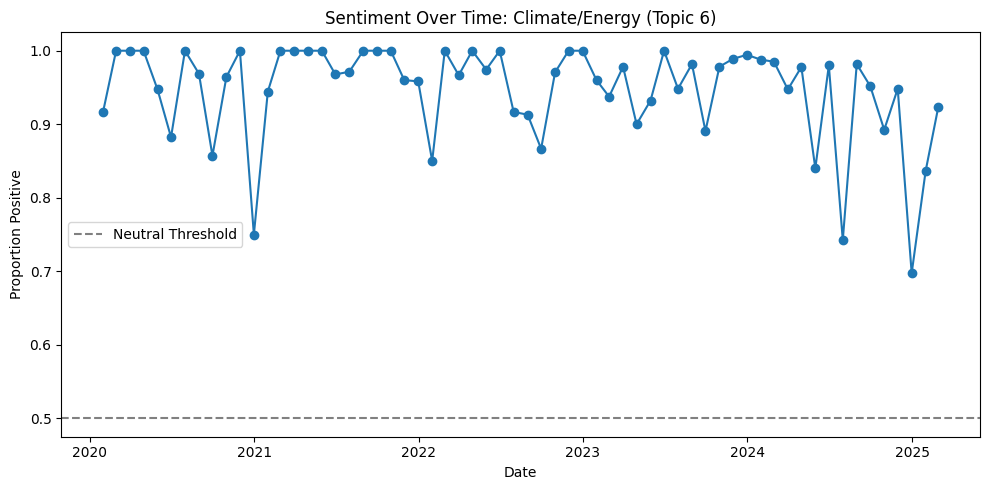

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


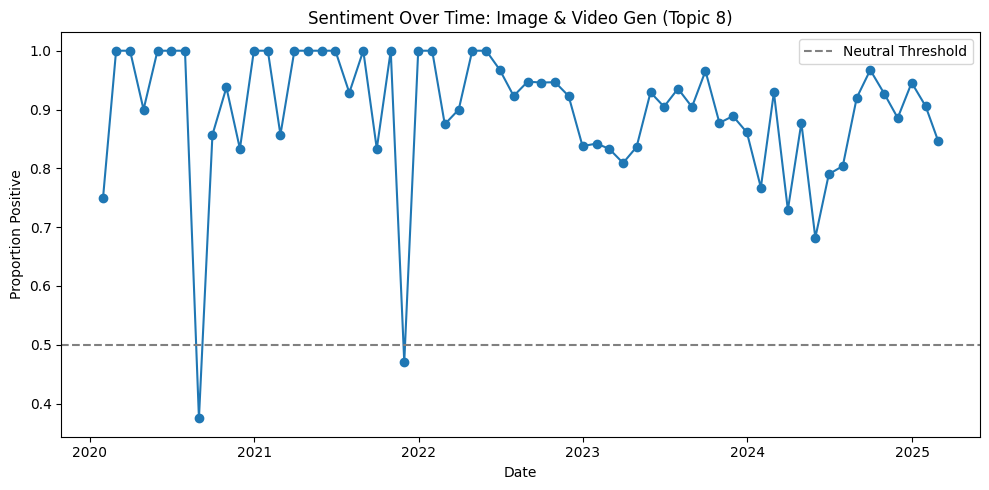

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


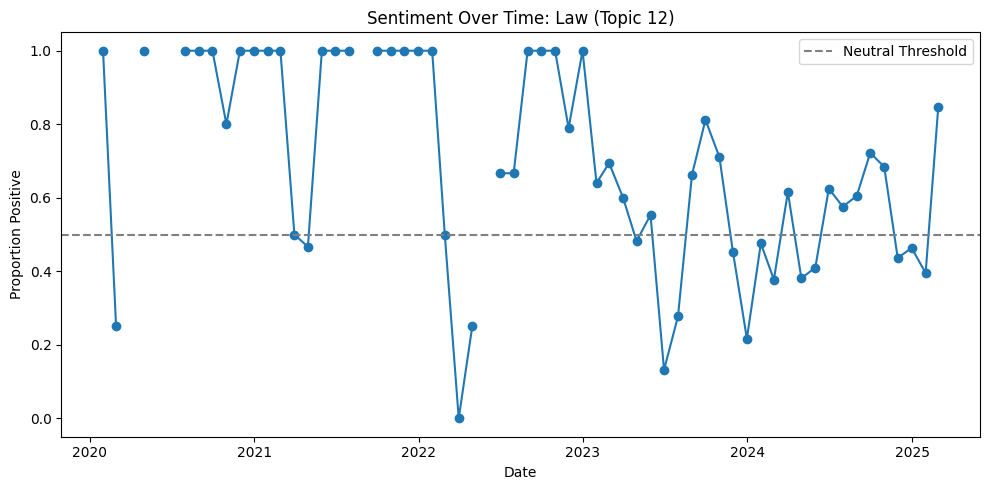

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


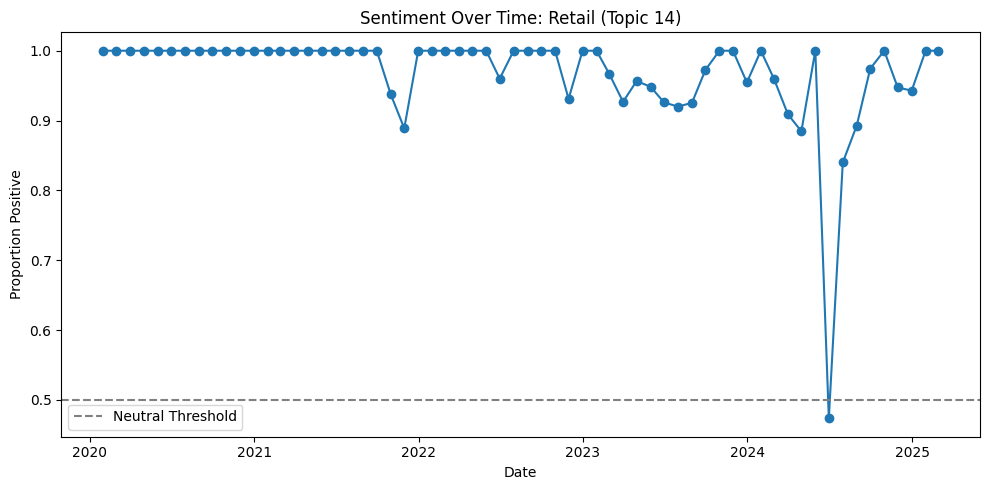

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


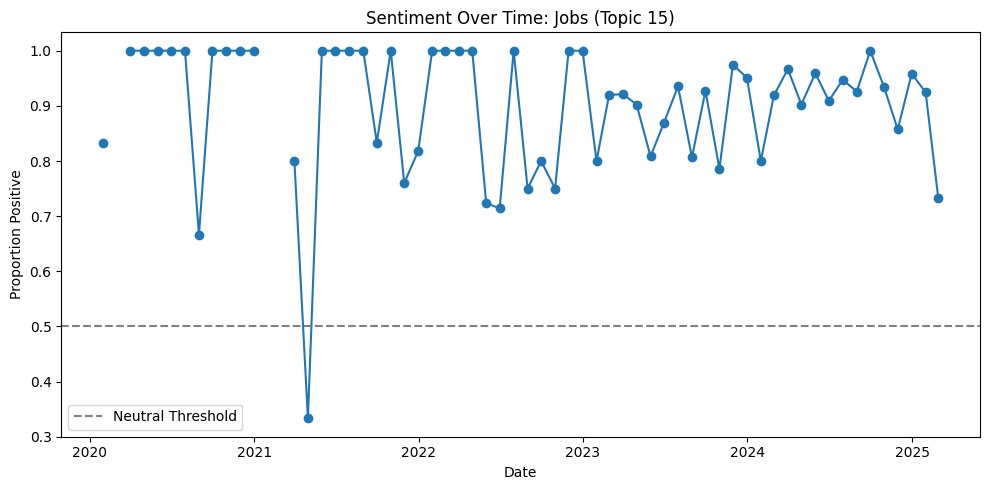

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


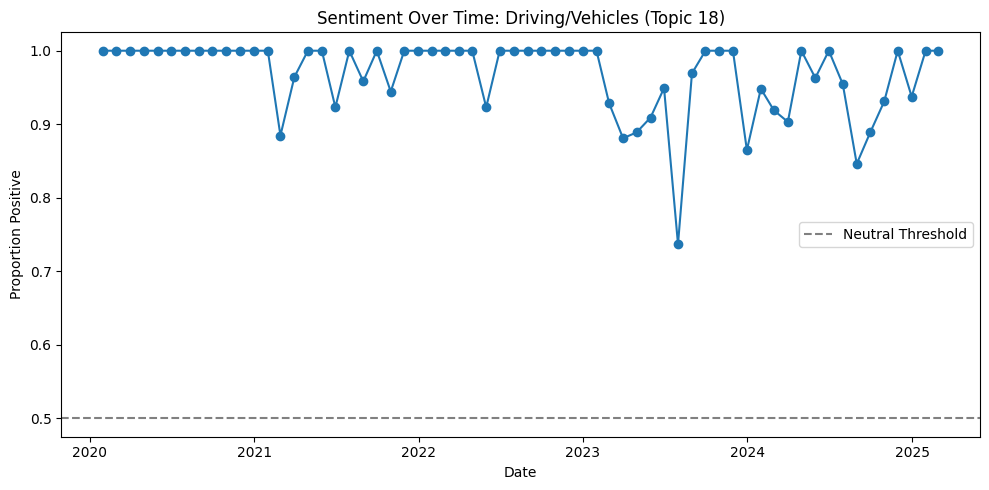

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


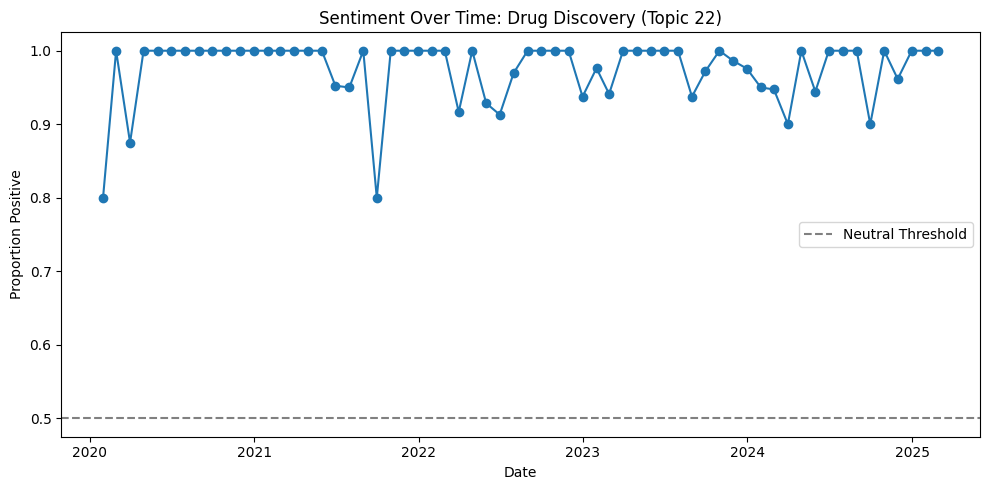

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


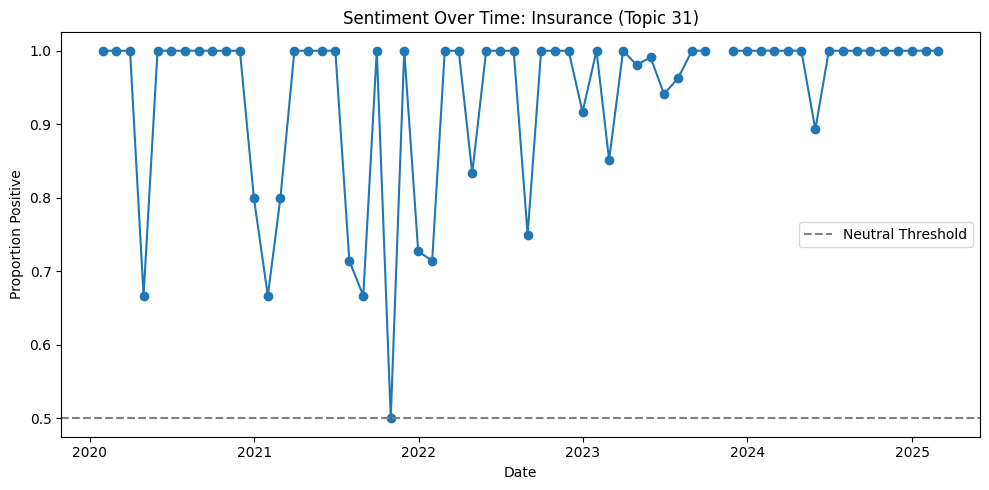

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


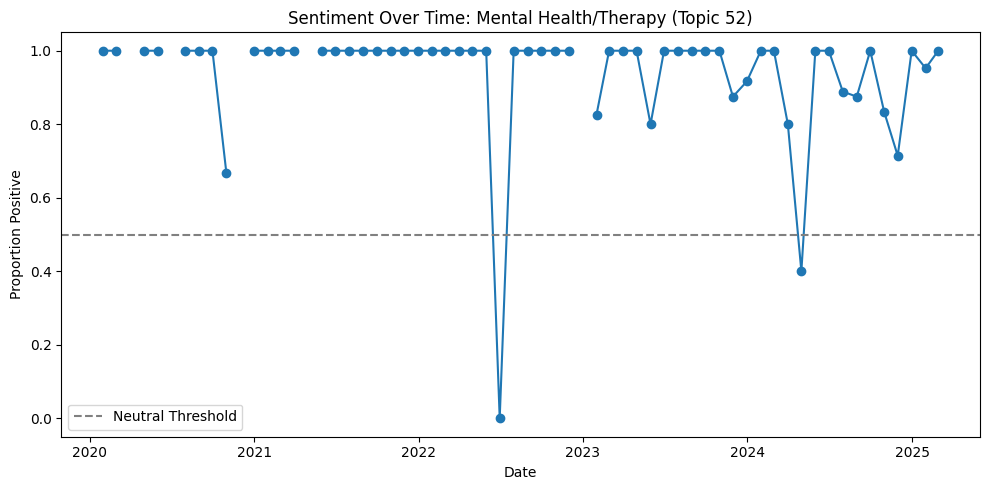

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


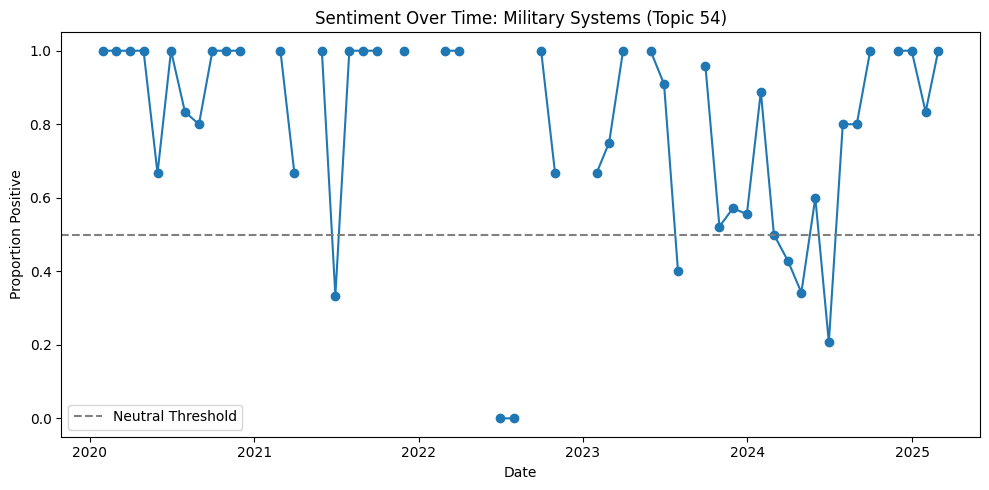

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


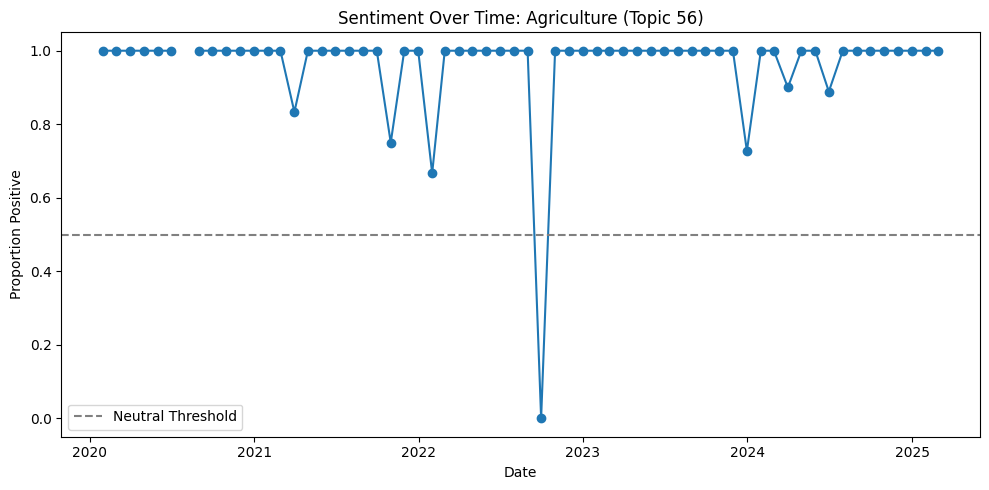

/var/folders/t6/n_h66qsx6rz5862xz5zck5sm0000gq/T/ipykernel_53705/3598461235.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()


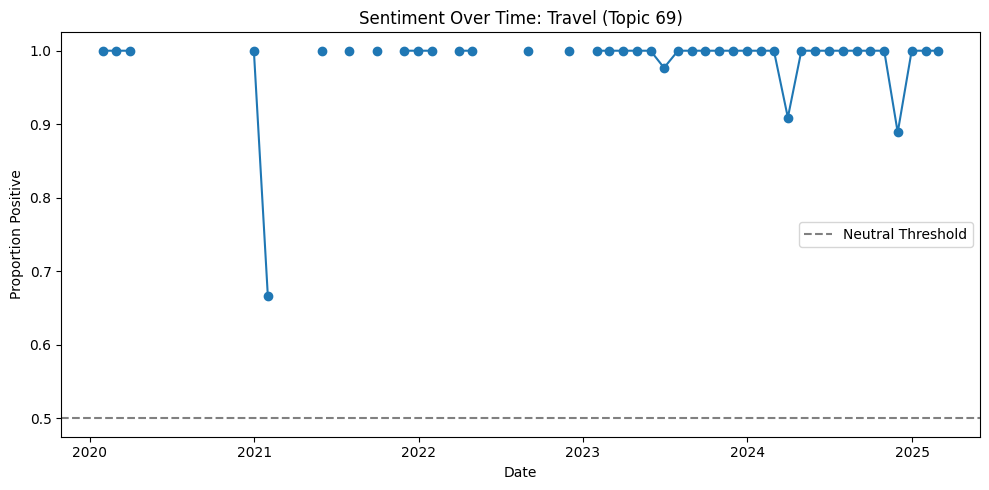

In [57]:
for topic in sorted(topic_names.keys()):
    # Filter the dataframe for the current topic.
    df_topic = df_sent2[df_sent2['topic'] == topic]
    if df_topic.empty:
        continue  # Skip if there is no data for this topic.
    
    # Group by month (using month end 'ME' or month start 'MS') and compute the average binary sentiment.
    sentiment_over_time = df_topic.groupby(pd.Grouper(key='date', freq='M'))['sentiment_binary'].mean().reset_index()
    
    # Create the plot for this topic.
    plt.figure(figsize=(10, 5))
    plt.plot(sentiment_over_time['date'], sentiment_over_time['sentiment_binary'], marker='o', linestyle='-')
    plt.xlabel("Date")
    plt.ylabel("Proportion Positive")
    plt.title(f"Sentiment Over Time: {topic_names[topic]} (Topic {topic})")
    plt.axhline(0.5, color='gray', linestyle='--', label="Neutral Threshold")
    plt.legend()
    plt.tight_layout()
    plt.show()